In [5]:
import sys
sys.path.append('../src')

from loader import train_dev_test, imread
import matplotlib.pyplot as plt
from preprocessing import (str2coords, 
                           coords2str,
                           rotate,
                           coords_to_2d,
                           get_img_coords,
                           preprocess_image,
                           get_mask_and_regr)
from visualizing import imshow_train, show_img_mask, visualize
import numpy as np
from postprocessing import (convert_3d_to_2d,
                            clear_duplicates,
                            extract_coords)
from modeling import MyUNet, criterion, criter_objective, car_detector, get_mesh
import torch
from torch import optim
import pandas as pd

In [2]:
train, test, train_dataset, dev_dataset, test_dataset=train_dev_test(PATH = '../data/pku-autonomous-driving/')

num of cars outside image bounds: 998 out of all 49684  cars in train


In [3]:
n_epochs = 3
device = torch.device("cuda")
batch_size = 4
model = MyUNet(8,batch_size=batch_size).to(device)
cd = car_detector(
                 model, 
                 train_dataset,
                 dev_dataset,
                 device = torch.device("cuda"), 
                 optimizer=optim.AdamW,
                 lr=0.00001,
                 n_epoch = n_epochs, 
                 batch_size = batch_size,
                 w_mask = 0.1,
                 history=None
                )

Loaded pretrained weights for efficientnet-b0


In [6]:
checkpoint = torch.load('../model/model_tmp.pth', map_location=device)
cd.model.load_state_dict(checkpoint)
cd.history=pd.read_csv('../model/history_tmp.csv')

In [7]:
cd.history.head()

,Unnamed: 0,Unnamed: 0.1,train_loss,dev_loss
0,0,0.000000,1.356879,164.305191
1,1,0.001043,0.544658,NaN
2,2,0.002086,1.169972,NaN
3,3,0.003128,0.807289,NaN
4,4,0.004171,0.767952,NaN


In [8]:
cd.fit(start_epoch=1)

100%|██████████| 959/959 [20:18<00:00,  1.27s/it]


Train Epoch: 1 	LR: 0.000010	Loss: 0.812311


  0%|          | 0/959 [00:00<?, ?it/s]

Dev loss: 156.5117


100%|██████████| 959/959 [20:07<00:00,  1.26s/it]


Train Epoch: 2 	LR: 0.000010	Loss: 0.849304


  0%|          | 0/959 [00:00<?, ?it/s]

Dev loss: 152.4213


100%|██████████| 959/959 [20:08<00:00,  1.26s/it]


Train Epoch: 3 	LR: 0.000010	Loss: 0.974614
Dev loss: 148.3002


In [9]:
cd.save_model(name='model_16epoch.pth', PATH='../model/')

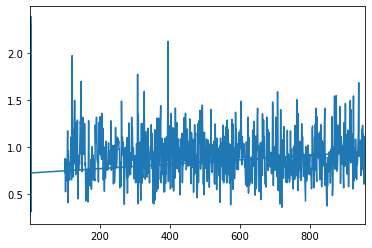

In [11]:
cd.view_train_loss()

In [12]:
test.head()

,ImageId,PredictionString,numcars
0,ID_18fb86d04,0.5 0.5 0.5 0.0 0.0 0.0 1.0,1
1,ID_ce06d4dc1,0.5 0.5 0.5 0.0 0.0 0.0 1.0,1
2,ID_afe07078f,0.5 0.5 0.5 0.0 0.0 0.0 1.0,1
3,ID_37caf75aa,0.5 0.5 0.5 0.0 0.0 0.0 1.0,1
4,ID_7655363ca,0.5 0.5 0.5 0.0 0.0 0.0 1.0,1


In [40]:
from torch.utils.data import Dataset, DataLoader

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if __name__ == '__main__':


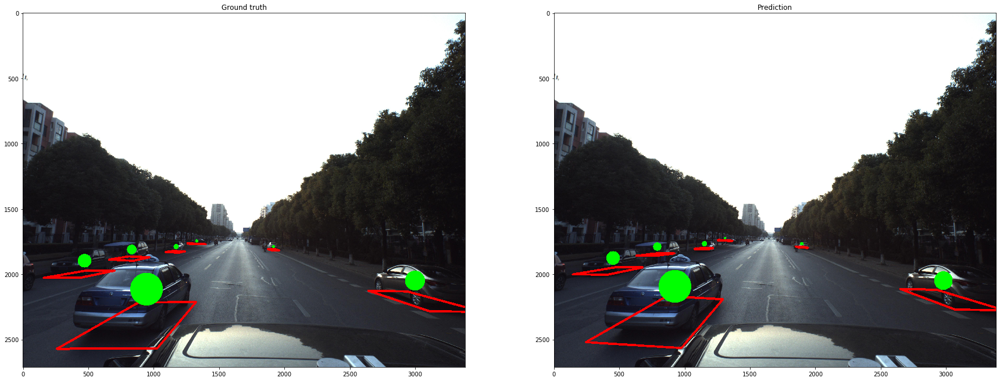

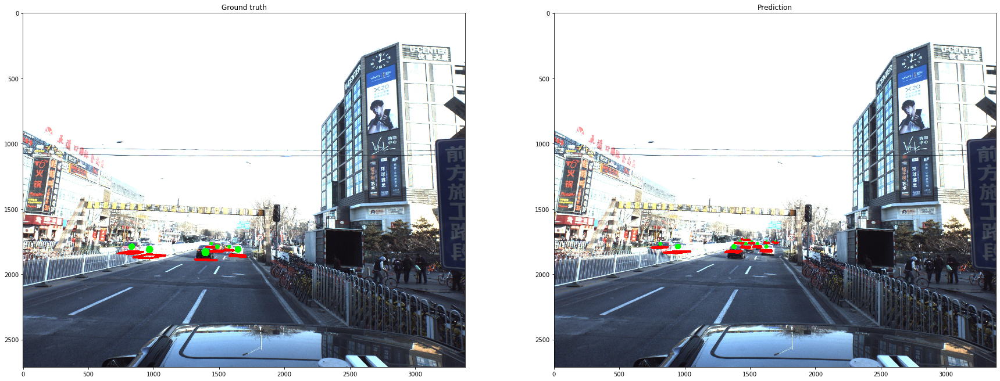

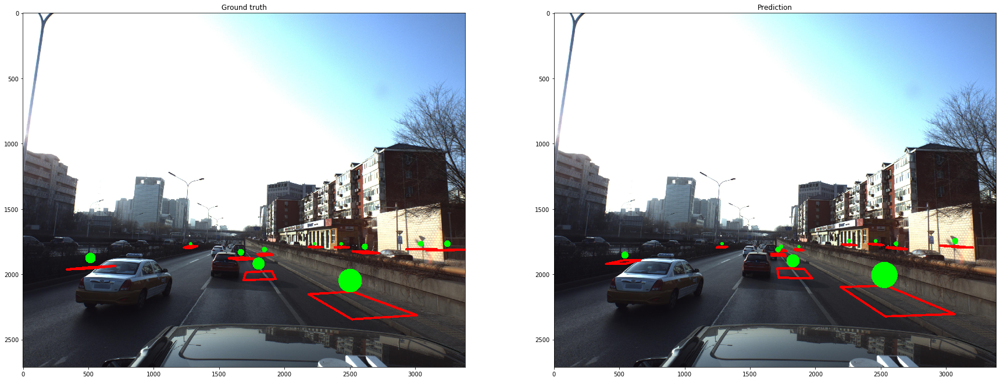

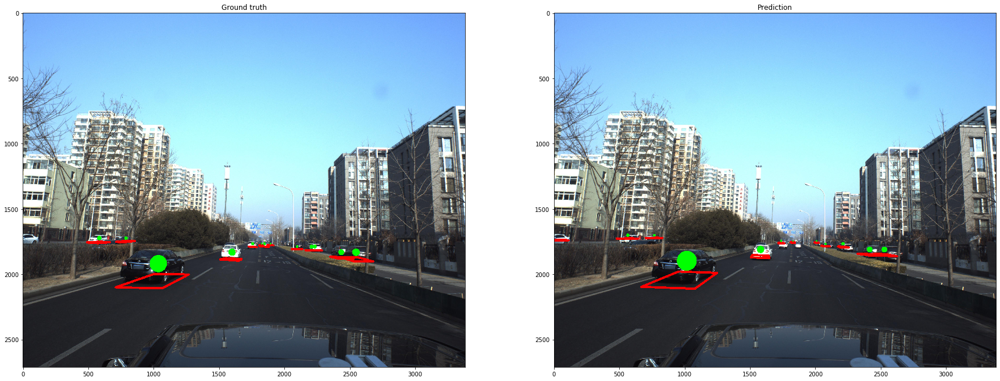

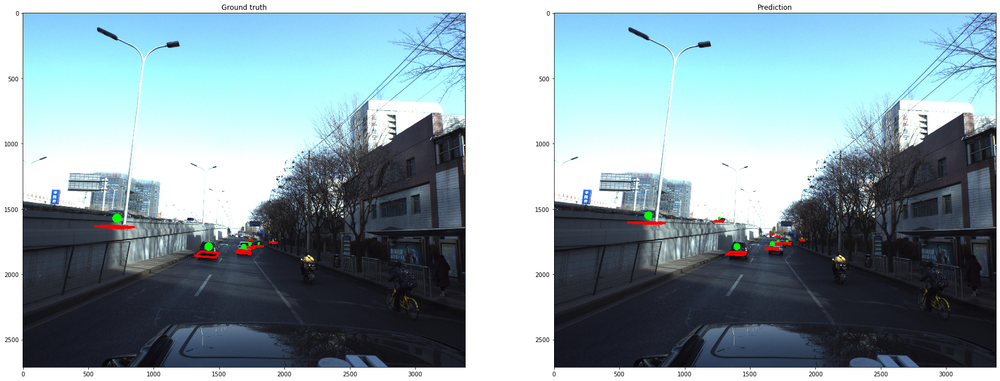

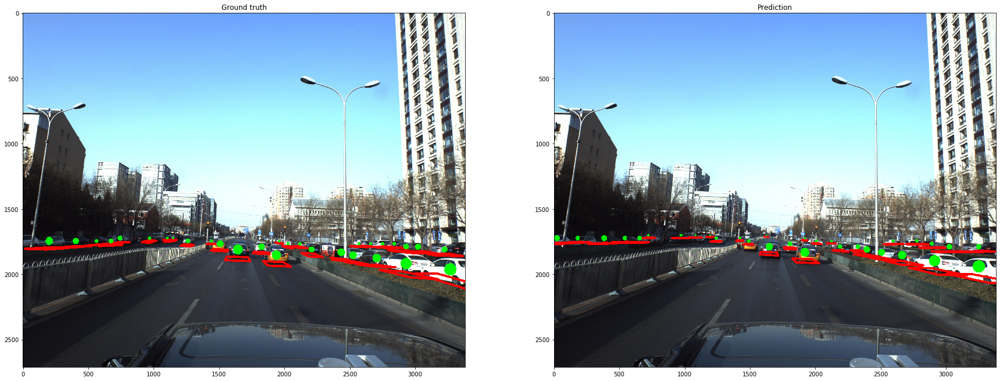

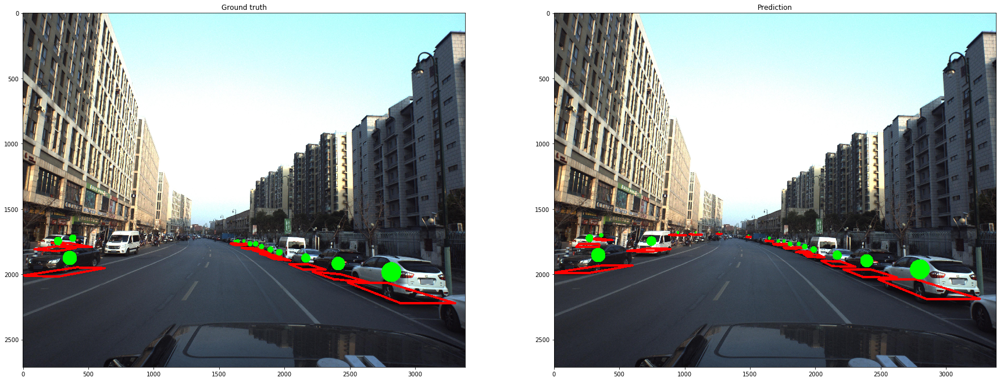

In [ ]:
torch.cuda.empty_cache()
gc.collect()

train_images_dir = '../data/pku-autonomous-driving/' + 'train_images/{}.jpg'

for idx in range(10,18):
    img, mask, regr,_,_ = dev_dataset[idx]
    
    output = cd.model(torch.tensor(img[None]).to(device)).data.cpu().numpy()
    coords_pred = extract_coords(output[0], threshold = -1.5)
    coords_true = extract_coords(np.concatenate([mask[None], regr], 0),0)
    
    img = imread(train_images_dir.format(dev_dataset.df['ImageId'].iloc[idx]))
    
    fig, axes = plt.subplots(1, 2, figsize=(30,30))
    axes[0].set_title('Ground truth')
    axes[0].imshow(visualize(img, coords_true))
    axes[1].set_title('Prediction')
    axes[1].imshow(visualize(img, coords_pred))
    plt.show()

In [33]:
from postprocessing import find_peak

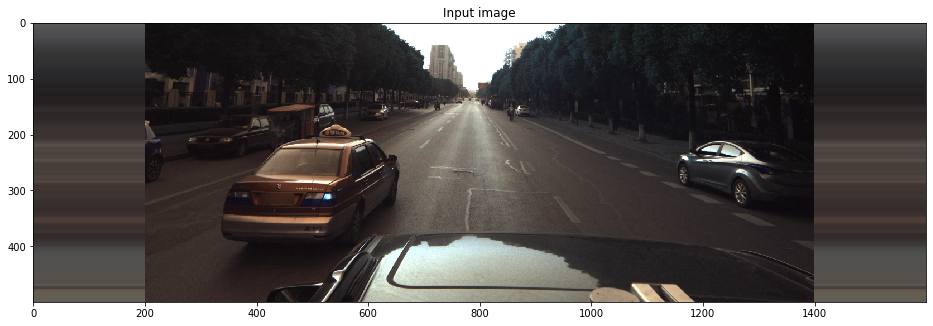

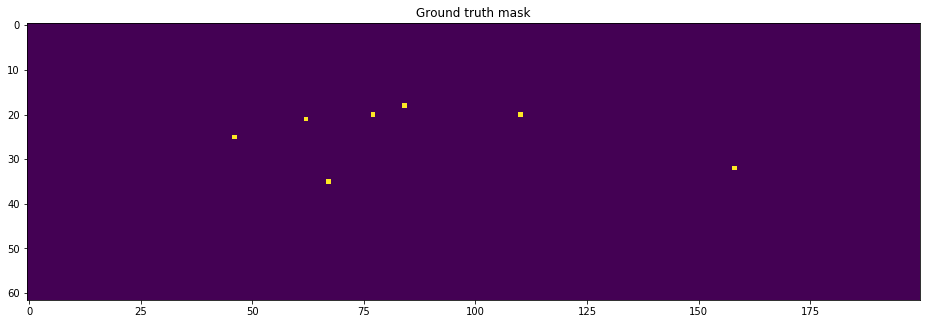

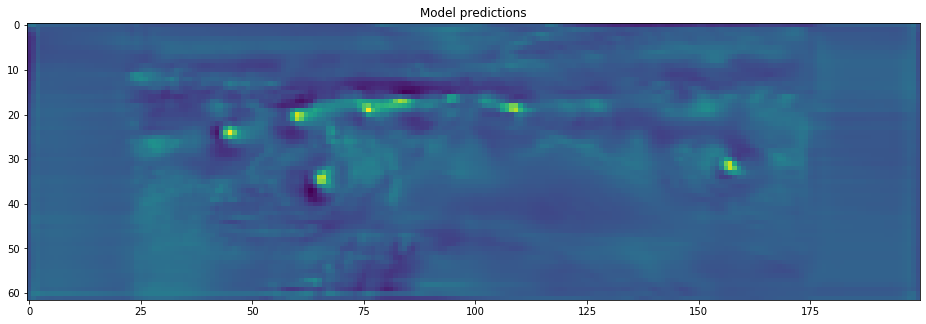

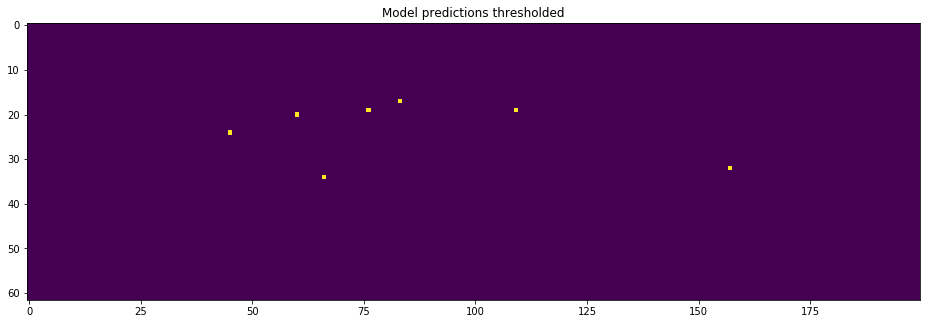

In [38]:
img, mask, regr, mask_gaus, _ = dev_dataset[10]

img = img.data.cpu().numpy()
mask = mask.data.cpu().numpy()

plt.figure(figsize=(16,16))
plt.title('Input image')
plt.imshow(np.rollaxis(img, 0, 3))
plt.show()

plt.figure(figsize=(16,16))
plt.title('Ground truth mask')
plt.imshow(mask)
plt.show()

output = model(torch.tensor(img[None]).to(device))
logits = output[0,0].data.cpu().numpy()

plt.figure(figsize=(16,16))
plt.title('Model predictions')
plt.imshow(logits)
plt.show()

plt.figure(figsize=(16,16))
plt.title('Model predictions thresholded')
plt.imshow((logits > -1.6)*find_peak(logits))
plt.show()

In [64]:
predictions= []
#preds = []
test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)

cd.model.eval()

for i,(img, _, _, _, test_mask_batch) in enumerate(test_loader):
    with torch.no_grad():
        output = cd.model(img.to(device))
    output = output.data.cpu().numpy()
    for out in output:
        coords = extract_coords(out, threshold = -1.2)
        s = coords2str(coords)
        predictions.append(s)

In [65]:
test['PredictionString'] = predictions
test.to_csv('../data/output/predictions_16epoch12.csv', index=False)

test.head()


,ImageId,PredictionString,numcars
0,ID_18fb86d04,0.12904367 2.971082075273703 -3.10668324505025...,1
1,ID_ce06d4dc1,0.10371938 0.09037811213272581 -3.074222708242...,1
2,ID_afe07078f,0.10284141 -3.1035767077788825 -3.117178915190...,1
3,ID_37caf75aa,0.11439284 0.09088487243315786 -3.096423747139...,1
4,ID_7655363ca,0.13483301 3.0589812649712 -3.1036898886137685...,1


In [66]:
del test['numcars']
test.head()

,ImageId,PredictionString
0,ID_18fb86d04,0.12904367 2.971082075273703 -3.10668324505025...
1,ID_ce06d4dc1,0.10371938 0.09037811213272581 -3.074222708242...
2,ID_afe07078f,0.10284141 -3.1035767077788825 -3.117178915190...
3,ID_37caf75aa,0.11439284 0.09088487243315786 -3.096423747139...
4,ID_7655363ca,0.13483301 3.0589812649712 -3.1036898886137685...


In [67]:
test.to_csv('../data/output/predictions_16epoch12.csv', index=False)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if __name__ == '__main__':


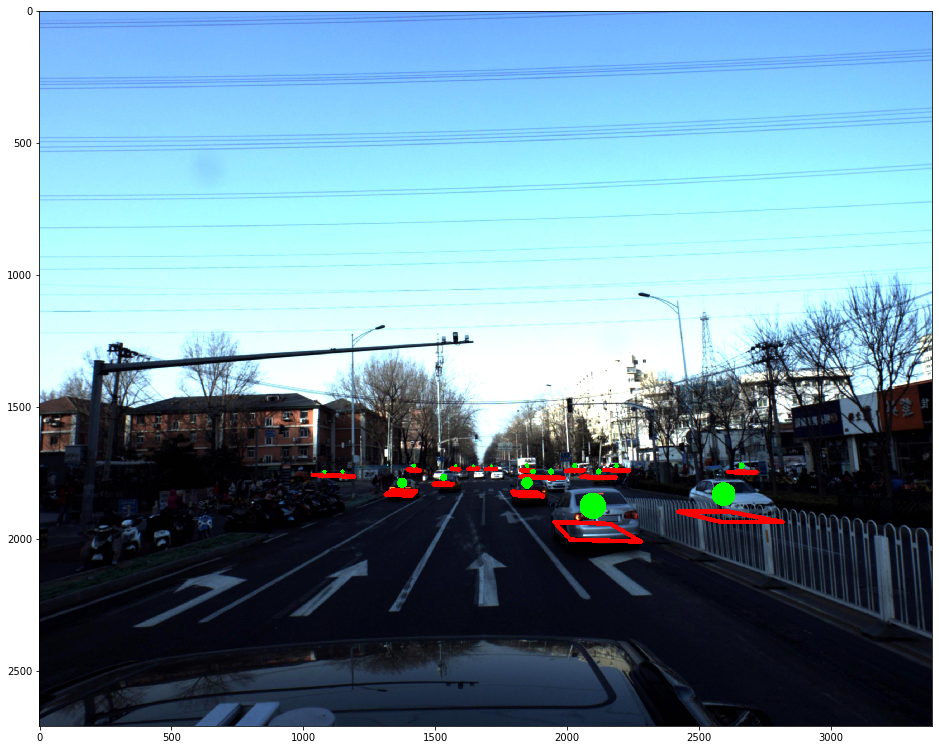

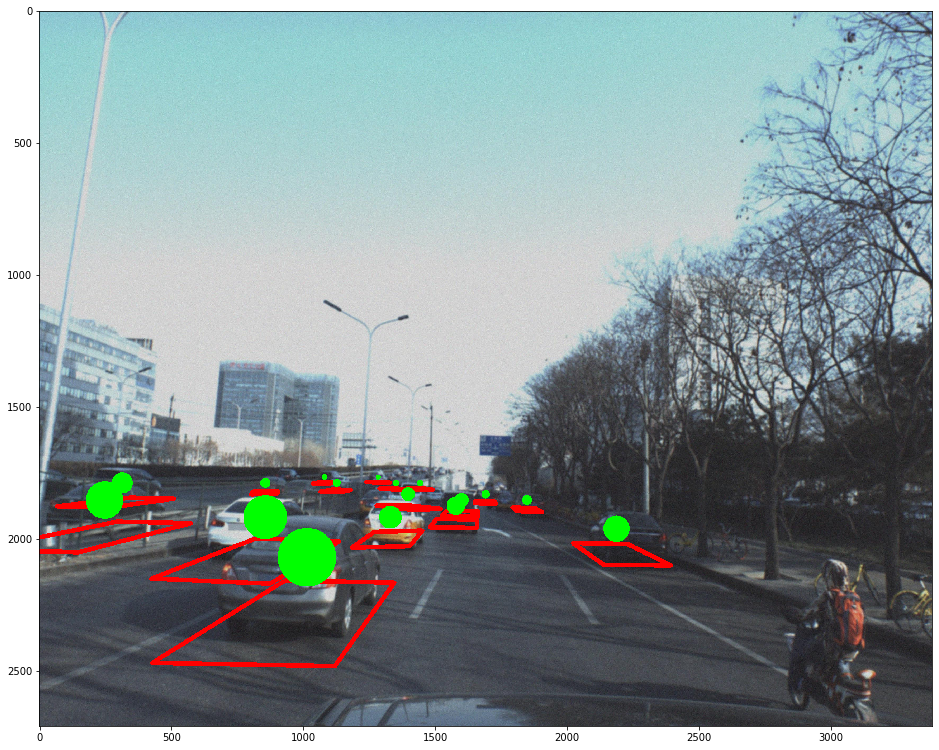

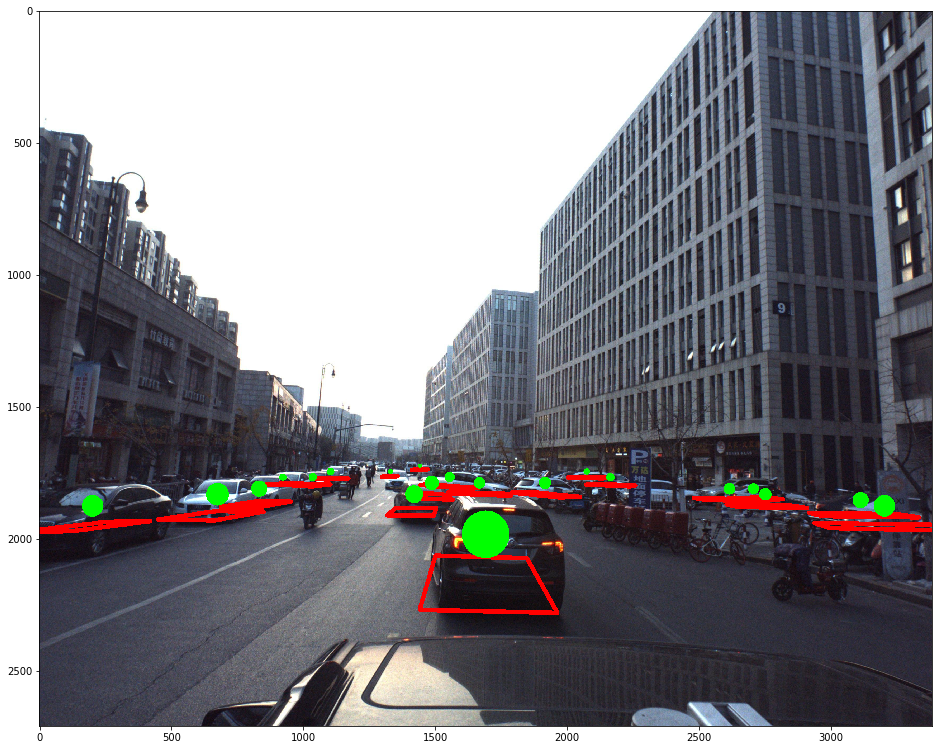

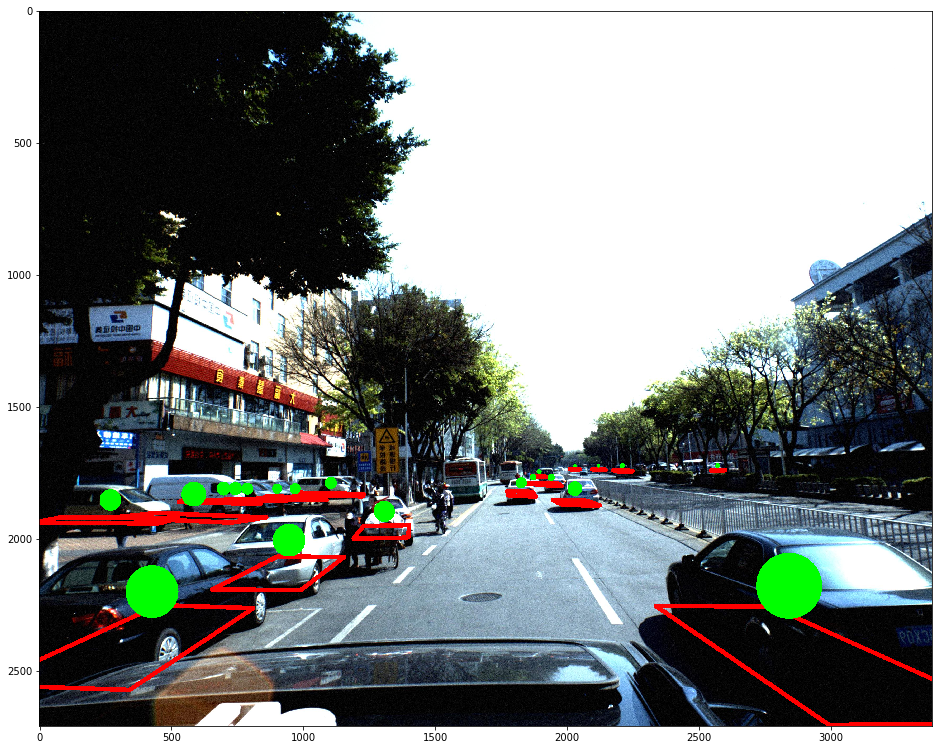

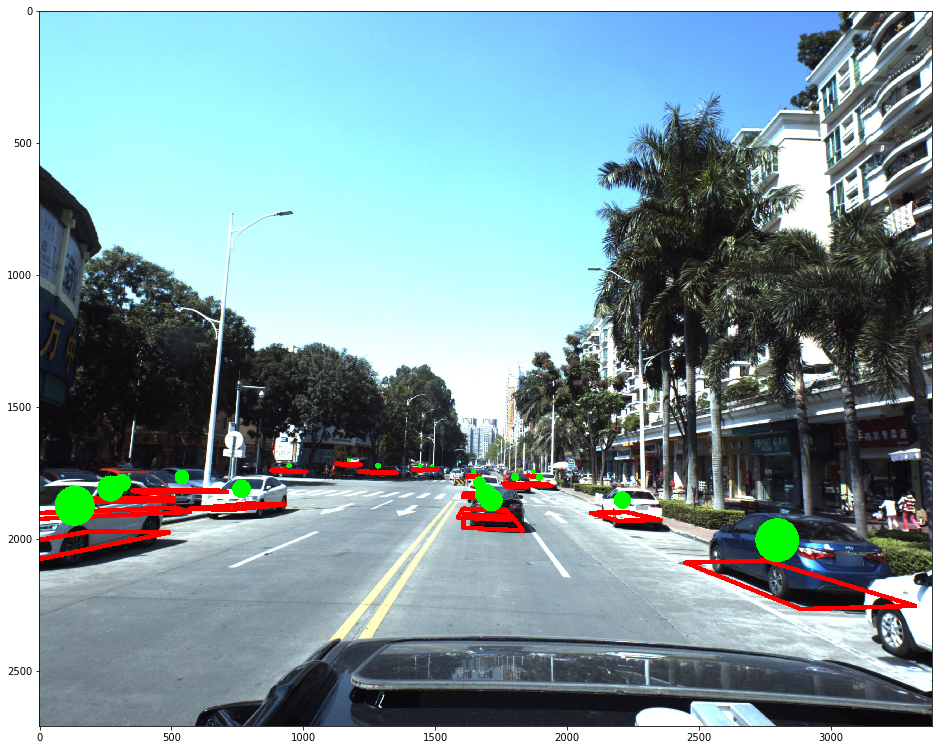

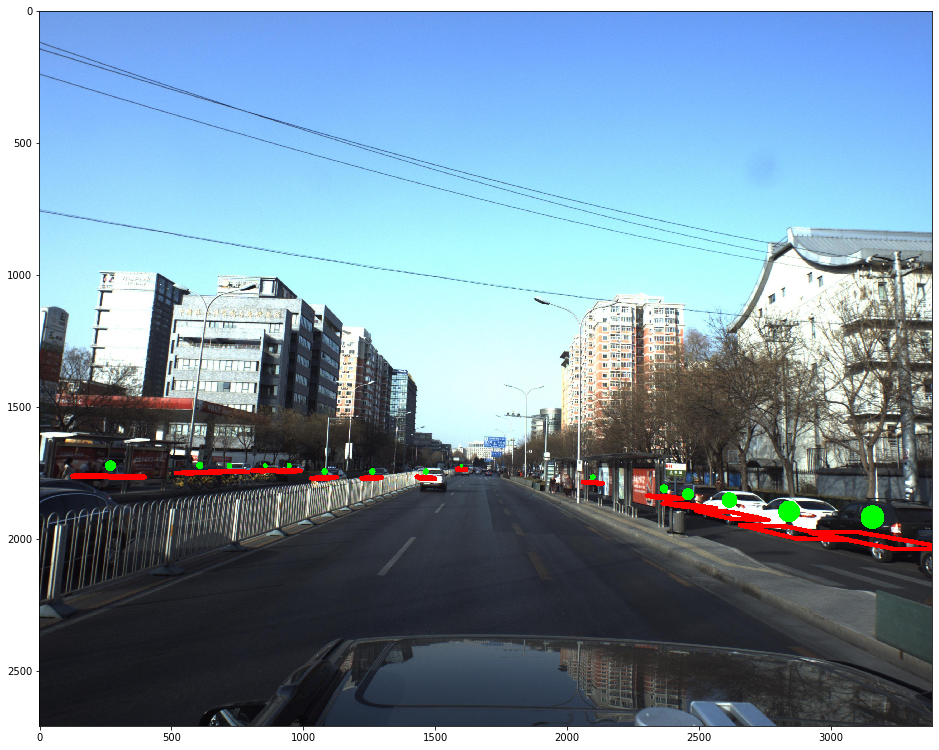

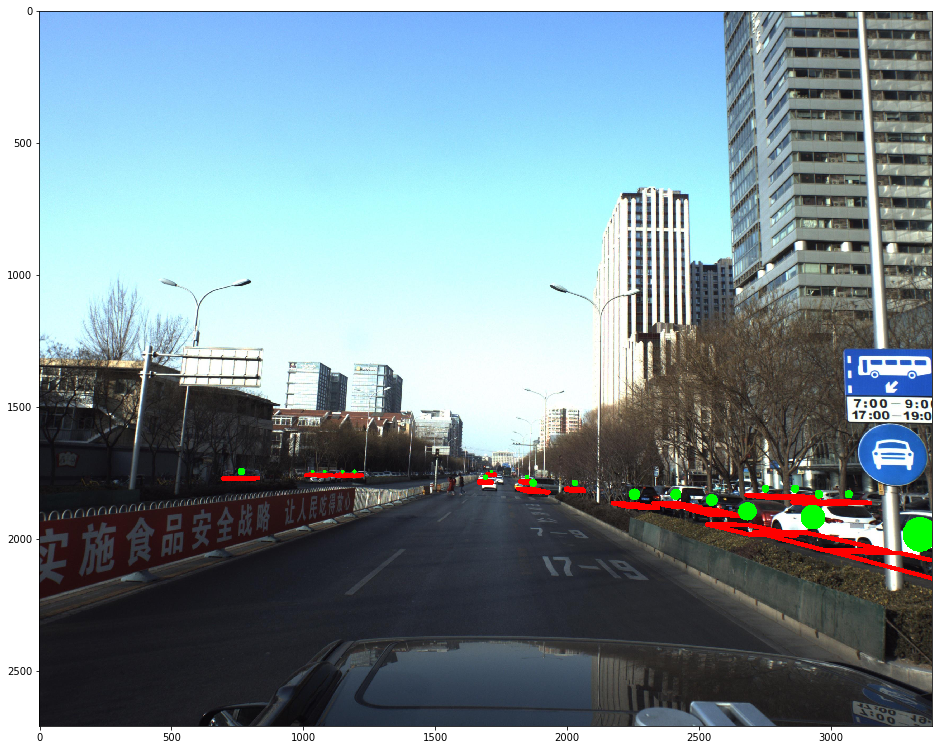

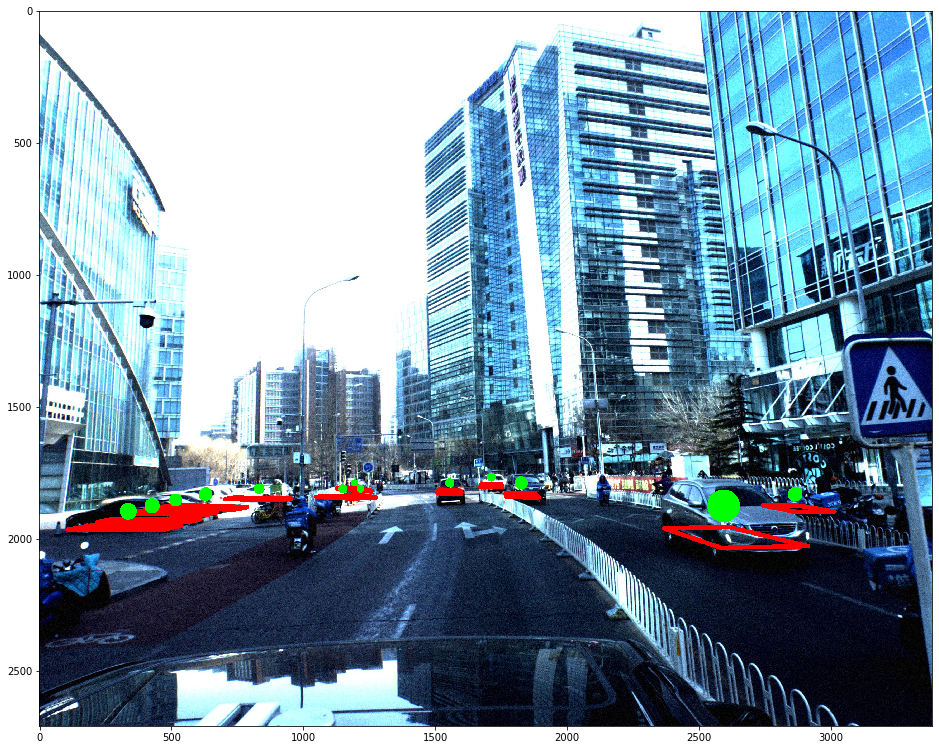

In [63]:
torch.cuda.empty_cache()
gc.collect()

test_images_dir = '../data/pku-autonomous-driving/' + 'test_images/{}.jpg'

for idx in range(20,28):
    img, mask, regr,_,_ = test_dataset[idx]
    
    output = cd.model(torch.tensor(img[None]).to(device)).data.cpu().numpy()
    coords_pred = extract_coords(output[0], threshold = -1.2)
    #coords_true = extract_coords(np.concatenate([mask[None], regr], 0),0)
    
    img = imread(test_images_dir.format(test_dataset.df['ImageId'].iloc[idx]))
    
    #fig, axes = plt.subplots(1, 2, figsize=(30,30))
    #axes[0].set_title('Ground truth')
    #axes[0].imshow(visualize(img, coords_true))
    #axes[0].imshow(img)
    #axes[1].set_title('Prediction')
    plt.figure(figsize=(16,16))
    plt.imshow(visualize(img, coords_pred))
    plt.show()